# Explaining Feature Importance by example of a Random Forest

In [1]:
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
from sklearn.base import clone 
from sklearn.metrics import r2_score
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

from rfpimp import plot_corr_heatmap
from rfpimp import permutation_importances

import eli5
import lime
import lime.lime_tabular
from eli5.sklearn import PermutationImportance
from treeinterpreter import treeinterpreter as ti, utils

# visualisations
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")
sns.set(rc = {'figure.figsize':(15, 10)})

/opt/anaconda3/envs/ml_env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.ensemble.forest module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.ensemble. Anything that cannot be imported from sklearn.ensemble is now part of the private API.
  warnings.warn(message, FutureWarning)
Using TensorFlow backend.


In [2]:
# function for creating a feature importance dataframe
def imp_df(column_names, importances):
    df = pd.DataFrame({'feature': column_names,
                       'feature_importance': importances}) \
           .sort_values('feature_importance', ascending = False) \
           .reset_index(drop = True)
    return df

# plotting a feature importance dataframe (horizontal barchart)
def var_imp_plot(imp_df, title):
    imp_df.columns = ['feature', 'feature_importance']
    sns.barplot(x = 'feature_importance', y = 'feature', data = imp_df, orient = 'h', color = 'royalblue') \
       .set_title(title, fontsize = 20)

In [3]:
boston = load_boston()
print(boston.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [4]:
y = boston.target
X = pd.DataFrame(boston.data, columns = boston.feature_names)
np.random.seed(seed = 42)
X['random'] = np.random.random(size = len(X))
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size = 0.8, random_state = 42)

## Noise column

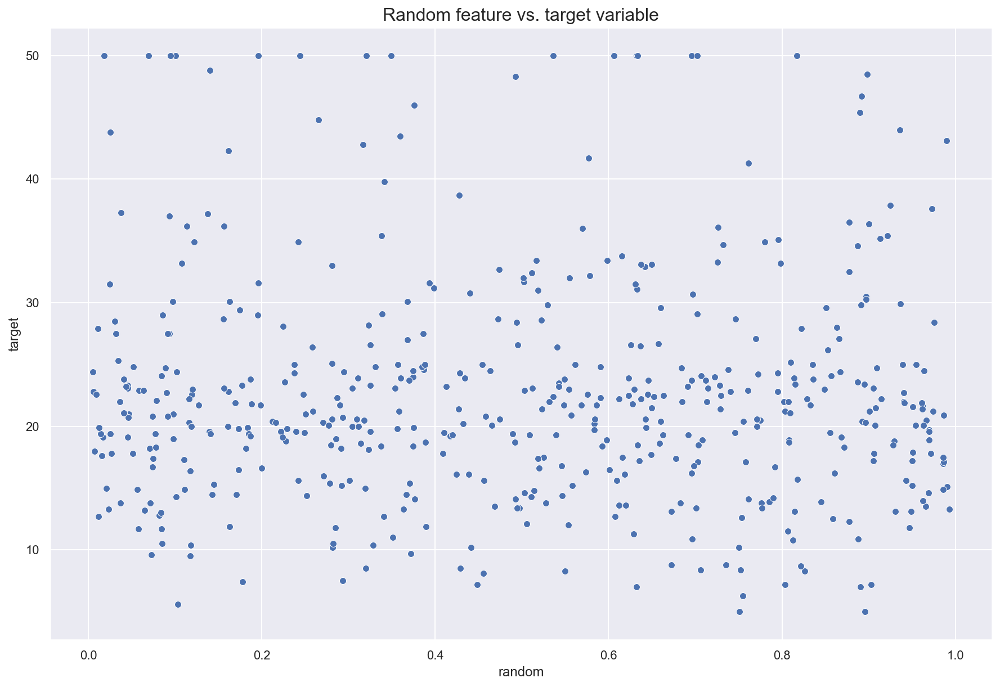

In [6]:
sns.scatterplot(
    x = 'random', 
    y = 'target', 
    data = X.assign(target = y)
).set_title('Random feature vs. target variable', fontsize = 16)
plt.show()

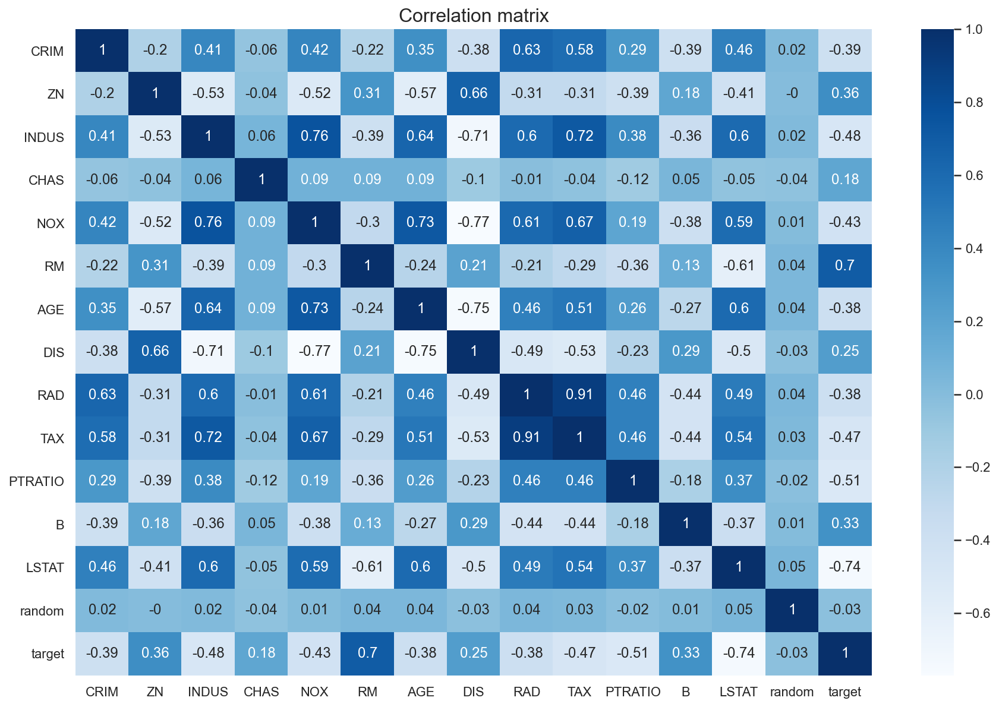

In [7]:
sns.heatmap(
    X.assign(target = y).corr().round(2), 
    cmap = 'Blues', 
    annot = True
).set_title('Correlation matrix', fontsize = 16)
plt.show()

### Benchmark model

In [8]:
rf = RandomForestRegressor(
    n_estimators = 100,
    n_jobs = -1,
    oob_score = True,
    bootstrap = True,
    random_state = 42
)

rf.fit(X_train, y_train)

RandomForestRegressor(n_jobs=-1, oob_score=True, random_state=42)

In [9]:
print('R^2 Training Score: {:.2f} \nOOB Score: {:.2f} \nR^2 Validation Score: {:.2f}'.format(
    rf.score(X_train, y_train), rf.oob_score_, rf.score(X_valid, y_valid)))

R^2 Training Score: 0.93 
OOB Score: 0.57 
R^2 Validation Score: 0.75


# Overall feature importances

### Using default sklearn

In [10]:
base_imp = imp_df(X_train.columns, rf.feature_importances_)
base_imp

,feature,feature_importance
0,RM,0.420738
1,LSTAT,0.306595
2,DIS,0.071076
3,CRIM,0.069275
4,PTRATIO,0.027120
5,NOX,0.022073
6,B,0.020321
7,TAX,0.019958
8,AGE,0.018502
9,random,0.010240


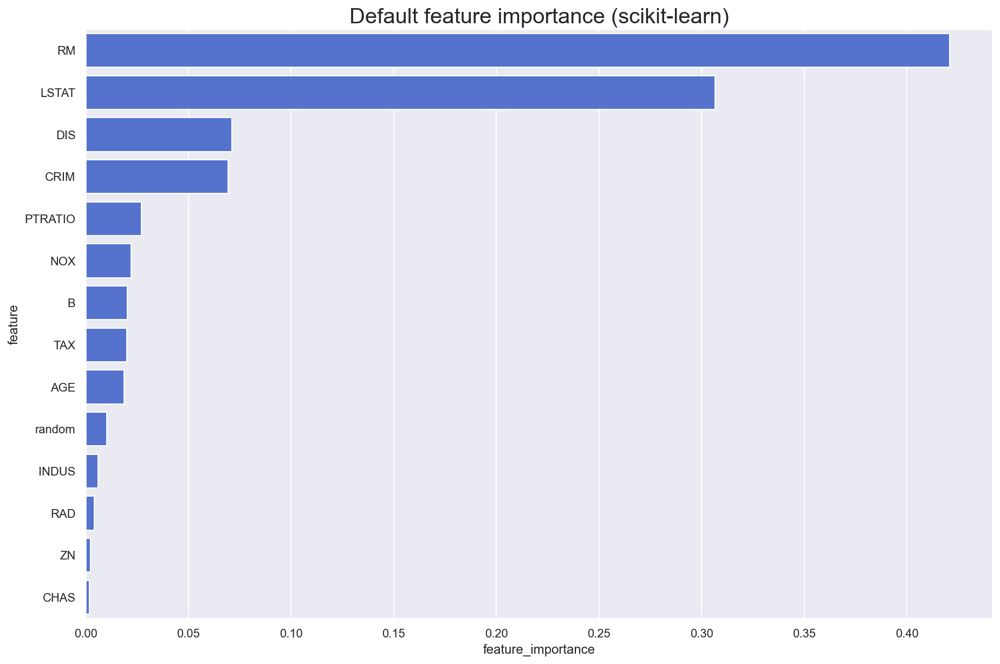

In [11]:
var_imp_plot(base_imp, 'Default feature importance (scikit-learn)')

### Permutation feature importance

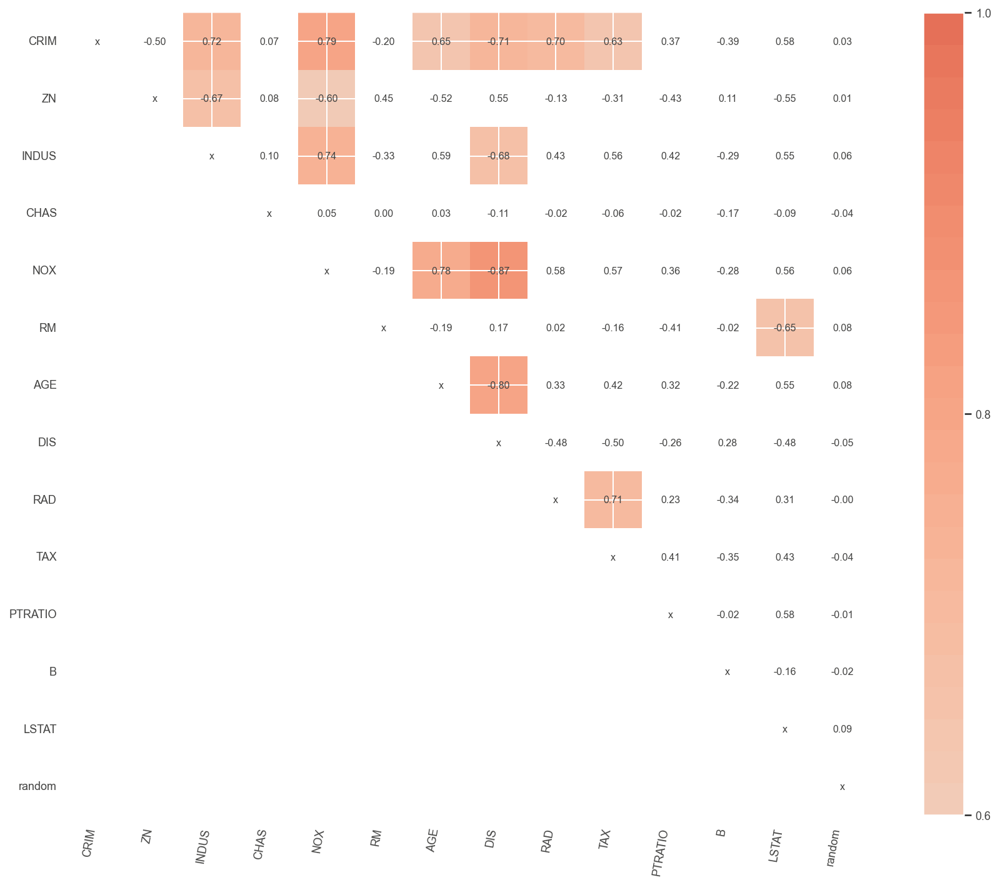

In [12]:
viz = plot_corr_heatmap(X_train, figsize=(15,10))
viz.view()

In [13]:
def r2(rf, X_train, y_train):
    return r2_score(y_train, rf.predict(X_train))

perm_imp_rfpimp = permutation_importances(rf, X_train, y_train, r2)
perm_imp_rfpimp.reset_index(drop = False, inplace = True)

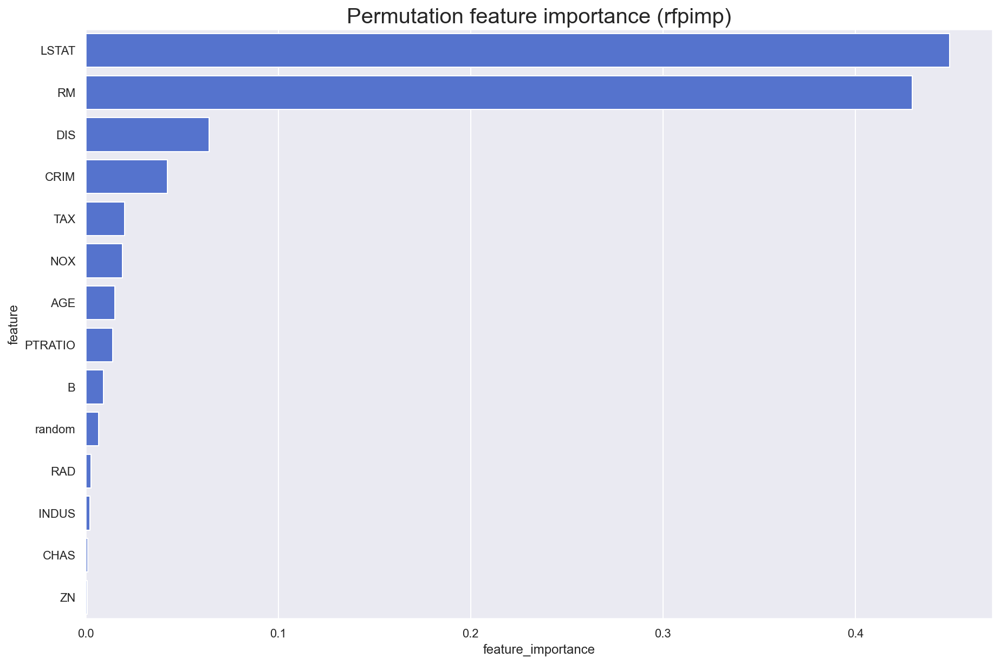

In [14]:
var_imp_plot(perm_imp_rfpimp, 'Permutation feature importance (rfpimp)')

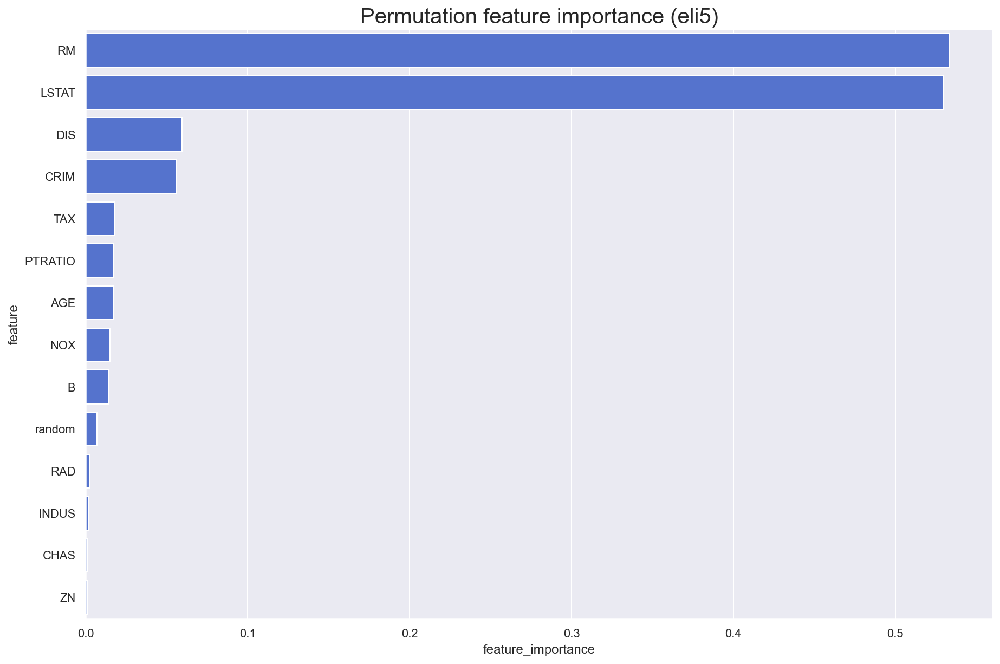

In [15]:
perm = PermutationImportance(rf, cv = None, refit = False, n_iter = 50).fit(X_train, y_train)
perm_imp_eli5 = imp_df(X_train.columns, perm.feature_importances_)
var_imp_plot(perm_imp_eli5, 'Permutation feature importance (eli5)')

In [16]:
eli5.show_weights(perm)

Weight,Feature
0.5334 ± 0.1262,x5
0.5294 ± 0.1864,x12
0.0596 ± 0.0174,x7
0.0562 ± 0.0161,x0
0.0176 ± 0.0098,x9
0.0171 ± 0.0053,x10
0.0171 ± 0.0054,x6
0.0150 ± 0.0081,x4
0.0141 ± 0.0076,x11
0.0070 ± 0.0028,x13


### Drop column feature importance

In [17]:
def drop_col_feat_imp(model, X_train, y_train, random_state = 42):
    
    # clone the model to have the exact same specification as the one initially trained
    model_clone = clone(model)
    # set random_state for comparability
    model_clone.random_state = random_state
    # training and scoring the benchmark model
    model_clone.fit(X_train, y_train)
    benchmark_score = model_clone.score(X_train, y_train)
    # list for storing feature importances
    importances = []
    
    # iterating over all columns and storing feature importance (difference between benchmark and new model)
    for col in X_train.columns:
        model_clone = clone(model)
        model_clone.random_state = random_state
        model_clone.fit(X_train.drop(col, axis = 1), y_train)
        drop_col_score = model_clone.score(X_train.drop(col, axis = 1), y_train)
        importances.append(benchmark_score - drop_col_score)
    
    importances_df = imp_df(X_train.columns, importances)
    return importances_df

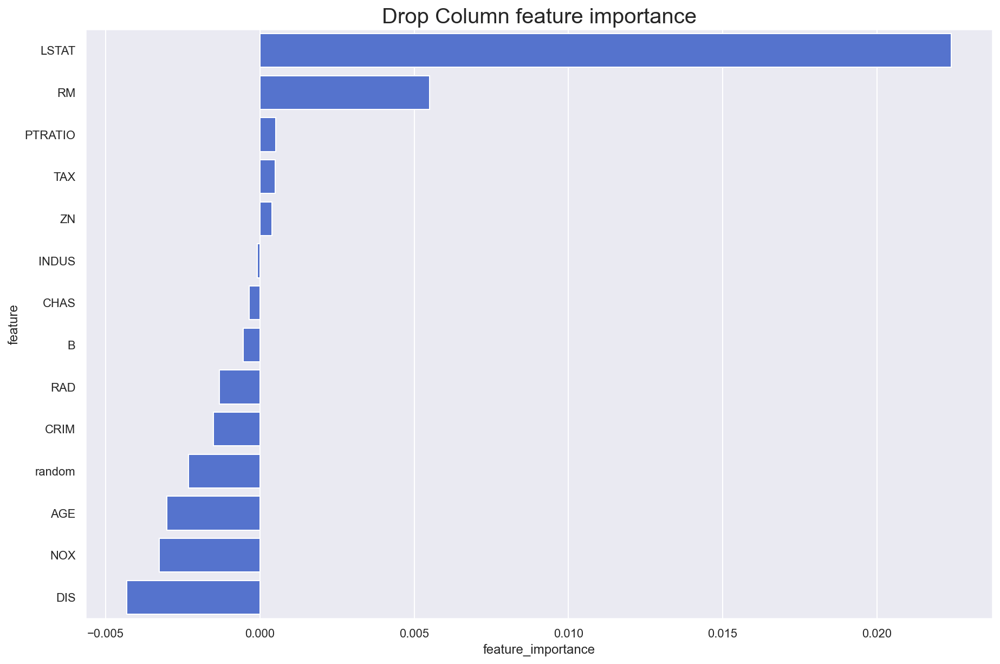

In [18]:
drop_imp = drop_col_feat_imp(rf, X_train, y_train)
var_imp_plot(drop_imp, 'Drop Column feature importance')

# Observation level feature importance

### Treeinterpreter

In [19]:
pred_diff = pd.DataFrame({'difference': abs(y_train - rf.predict(X_train))})

print('Index with smallest error:', pred_diff.sort_values('difference').head(1).index.values[0])
print('Index with largest error:', pred_diff.sort_values('difference', ascending = False).head(1).index.values[0])

Index with smallest error: 28
Index with largest error: 85


In [20]:
selected_rows = [28, 85]
selected_df = X_train.iloc[selected_rows,:].values
prediction, bias, contributions = ti.predict(rf, selected_df)

In [22]:
for i in range(len(selected_rows)):
    print("Row", selected_rows[i])
    print("Prediction: {:.3f}  Actual Value: {}".format(prediction[i][0], y_train[selected_rows[i]]))
    print("Bias (trainset mean)", bias[i])
    print("Feature contributions:")
    for c, feature in sorted(zip(contributions[i], X_train.columns), key=lambda x: -abs(x[0])):
        print(feature, round(c, 2))
    print("-"*20)

Row 28
Prediction: 31.003  Actual Value: 31.0
Bias (trainset mean) 22.54429702970297
Feature contributions:
RM 9.37
LSTAT -1.02
PTRATIO 0.86
CRIM 0.49
DIS -0.43
B -0.26
TAX -0.21
NOX -0.13
INDUS -0.07
ZN -0.06
random -0.06
AGE -0.02
RAD 0.01
CHAS 0.0
--------------------
Row 85
Prediction: 36.819  Actual Value: 50.0
Bias (trainset mean) 22.54429702970297
Feature contributions:
DIS 7.65
LSTAT 3.33
RM -1.87
CRIM 1.87
TAX 1.32
NOX 1.02
B 0.6
CHAS 0.36
PTRATIO -0.25
RAD 0.17
AGE 0.13
INDUS -0.03
random -0.01
ZN 0.0
--------------------


In [23]:
prediction1, bias1, contributions1 = ti.predict(rf, np.array([selected_df[0]]), joint_contribution=True)
prediction2, bias2, contributions2 = ti.predict(rf, np.array([selected_df[1]]), joint_contribution=True)

In [24]:
aggregated_contributions1 = utils.aggregated_contribution(contributions1)
aggregated_contributions2 = utils.aggregated_contribution(contributions2)

In [25]:
res = []
for k in set(aggregated_contributions1.keys()).union(set(aggregated_contributions2.keys())):
    res.append(
        ([X_train.columns[index] for index in k] , 
         aggregated_contributions1.get(k, 0) - aggregated_contributions2.get(k, 0)))   
         
for lst, v in (sorted(res, key=lambda x:-abs(x[1])))[:10]:
    print (lst, v)

['RM'] [8.92703989]
['RM', 'DIS'] [-3.88855409]
['LSTAT'] [-2.66498741]
['RM', 'DIS', 'LSTAT'] [-2.11048567]
['DIS', 'LSTAT'] [-1.4771055]
['CRIM', 'LSTAT'] [-1.34523732]
['NOX', 'LSTAT'] [-1.10895289]
['RM', 'TAX', 'LSTAT'] [-0.79699549]
['TAX', 'LSTAT'] [-0.50817755]
['CRIM', 'RM'] [0.48664993]


### LIME

In [26]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    mode = 'regression',
    feature_names = X_train.columns,
    categorical_features=[3], 
    categorical_names=['CHAS'], 
    discretize_continuous = True
)

In [29]:
np.random.seed(42)
exp = explainer.explain_instance(X_train.values[28], rf.predict, num_features=5)
exp.show_in_notebook(show_all=False) #only the features used in the explanation are displayed

np.random.seed(42)
exp = explainer.explain_instance(X_train.values[85], rf.predict, num_features=5)
exp.show_in_notebook(show_all=False)

np.random.seed(42)
exp = explainer.explain_instance(X_train.values[0], rf.predict, num_features=5)
exp.show_in_notebook(show_all=False)

np.random.seed(42)
exp = explainer.explain_instance(X_train.values[1], rf.predict, num_features=5)
exp.show_in_notebook(show_all=False)

np.random.seed(42)
exp = explainer.explain_instance(X_train.values[2], rf.predict, num_features=5)
exp.show_in_notebook(show_all=False)

np.random.seed(42)
exp = explainer.explain_instance(X_train.values[3], rf.predict, num_features=5)
exp.show_in_notebook(show_all=False)